In [29]:
import matplotlib.pyplot as plt
import numpy as np
import cv2
import os
from PIL import Image

In [30]:
# Loading images from path into proper data structure
# Set the directory path
imageDirectoryPath = 'D:/MyWorkspace/CameraTrapChallenge/CoherentSequenceIdentification/data/dama_dama_damhirsch_deer/dama_dama_damhirsch/dayvision'
# Get a list of all images in the path specified
imageItems = os.listdir(imageDirectoryPath)
imageList = []
for item in imageItems:
    # Check if the file is an image file
    if item.endswith(('.JPG', '.jpg')):
        # Read the image file using cv2.imread()
        image = cv2.imread(os.path.join(imageDirectoryPath, item))
        # imageInGrayScale = cv2.cvtColor(imageName, cv2.COLOR_BGR2GRAY)
        imageList.append(image)
print(f'Total number of image files loaded is: {len(imageList)}')

Total number of image files loaded is: 262


In [31]:
def getImageDifference(imageA, imageB):
        firstImageHist = cv2.calcHist([imageA], [0], None, [256], [0, 256])
        secondImageHist = cv2.calcHist([imageB], [0], None, [256], [0, 256])

        imgHistDiff = cv2.compareHist(firstImageHist, secondImageHist, cv2.HISTCMP_BHATTACHARYYA)
        imgTemplateProbabilityMatch = cv2.matchTemplate(firstImageHist, secondImageHist, cv2.TM_CCOEFF_NORMED)[0][0]
        imgTemplateDiff = 1 - imgTemplateProbabilityMatch

        # taking only 10% of histogram diff, since it's less accurate than template method
        commutativeImageDiff = (imgHistDiff / 10) + imgTemplateDiff
        return commutativeImageDiff

In [32]:
coherentSeq = []
i, j = 0, 1
while i < len(imageItems):
    seq = []
    while j < len(imageItems):
        calculatedImageDifference = getImageDifference(image[i], image[j])
        print(calculatedImageDifference)
        if calculatedImageDifference < 0.04:
            if imageItems[i] not in seq and imageItems[j] not in seq:
                seq.append(imageItems[i])
                seq.append(imageItems[j])
            i, j = i + 1, j + 1 
        else:
            break    
    if len(seq) > 0:    
        coherentSeq.append(seq) 
    i, j = i + 1, j + 1

print(coherentSeq)

0.02549435383926961
0.05299508275773159
0.02065660769954652
0.01787329437283145
0.01807632457561135
0.036278162783698296
0.023290289406852398
0.015438123192201777
0.015427142203323382
0.018951296510671588
0.01466818114116045
0.013609552288076063
0.01813123502691331
0.01628710613656756
0.01307241885959238
0.00978056170138822
0.013449459150236254
0.015124372796261812
0.017226394079026278
0.01425537278556234
0.016845970400652367
0.016027778701723214
0.011401325719467345
0.030975719923523846
0.018945618020170703
0.017179617408632154
0.047660022673609595
0.059766858494702396
0.03531085126784991
0.022955225736543586
0.03151672474424708
1.114436272904277
0.08901178822945167
0.09807328494694141
0.0994371280290603
0.1010766311117834
0.1009542151321003
0.09599481562533783
0.08962365365143256
0.07417375595988457
0.082463560172593
0.09161019845817485
0.09158933632140356
0.08845330154338223
0.09076140382106822
0.08752922638823003
0.08220276095765593
0.06930082493605241
0.0741769942733477
0.08313730

In [33]:
coherentSequenceImage = []
i = 0
scalePercent = 50
for imageSegment in coherentSeq:
    addImages = []
    for imageFile in coherentSeq[i]:
        if imageFile.endswith(('.JPG', '.jpg')):
            image = cv2.imread(os.path.join(imageDirectoryPath, imageFile))
            width = int(image.shape[1] * scalePercent / 100)
            height = int(image.shape[0] * scalePercent / 100)
            dim = (width, height)
            resized = cv2.resize(image, dim, interpolation = cv2.INTER_NEAREST)
            addImages.append(resized)
    i+=1
    coherentSequenceImage.append(addImages)

In [34]:
# Output for the number of identified coherent sequences
print(f'The total number of sequences detected is {i}')

The total number of sequences detected is 9


The images in sequence 1


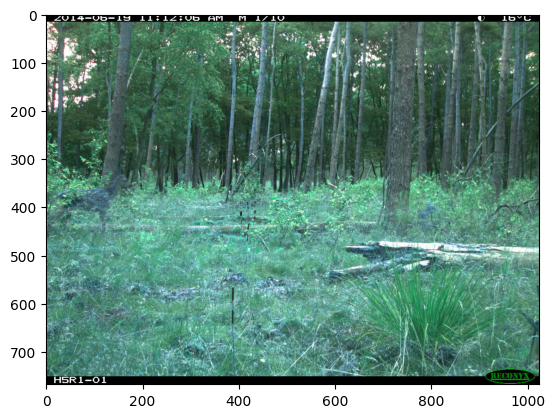

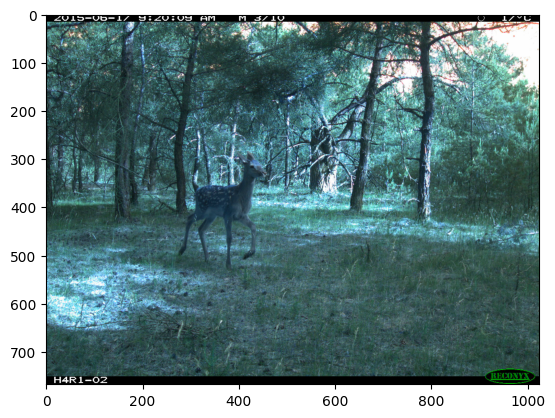

The images in sequence 2


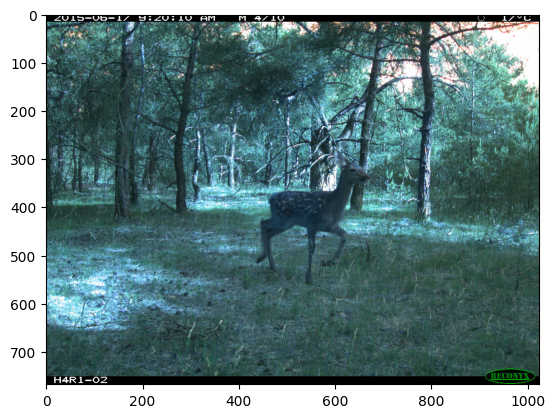

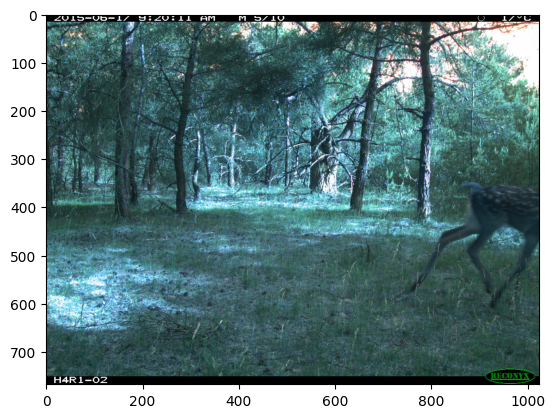

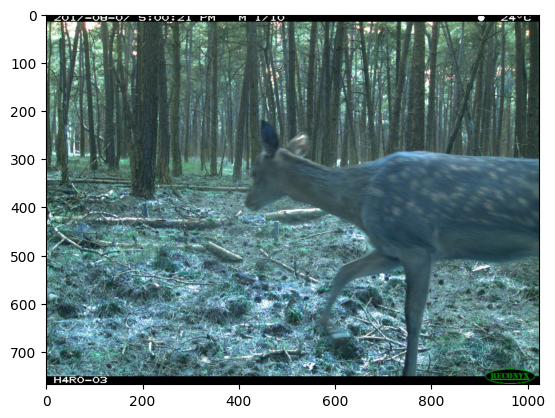

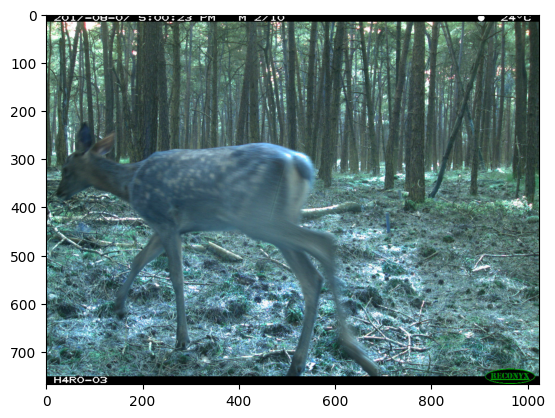

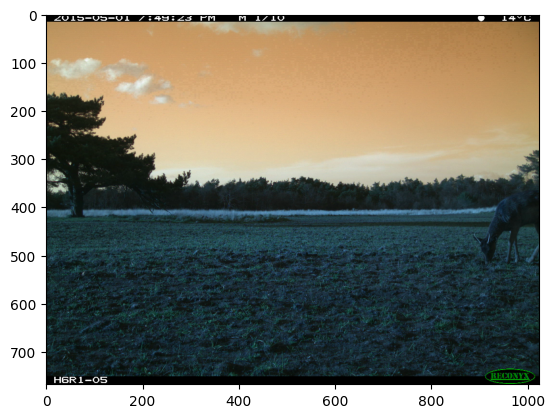

...

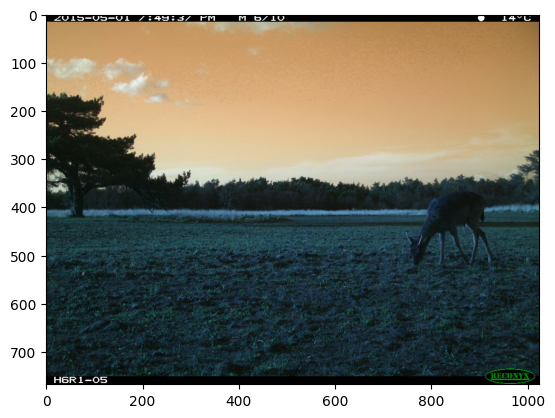

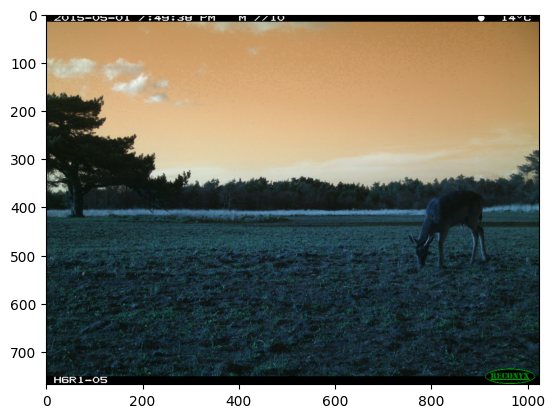

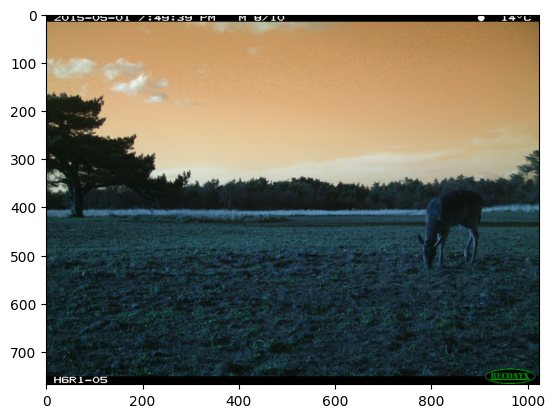

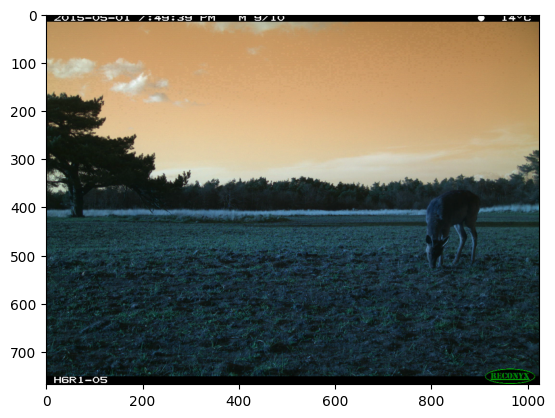

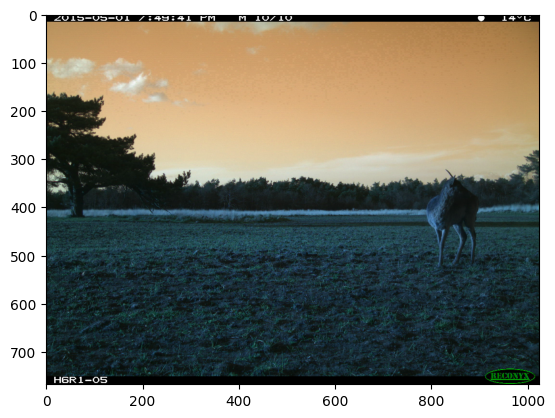

: 

In [35]:
# Printing the first 2 sequences to check

seqNum = 1
for sequence in coherentSequenceImage:
    if seqNum < 3:
        print(f'The images in sequence {seqNum}')
        for image in sequence:
            imgplot = plt.imshow(image)
            plt.show()
        seqNum += 1  
    else:
        break   